# GAIA Dataset - Supervised ML and More t-SNE

Notebook for 6/12 - 6/16

In [40]:
import os
import numpy as np
import matplotlib.pyplot as plt
import h5py
import time
import random
import math

data_dir = 'data/'
obs_color = "forestgreen"
syn_color = "violet"
np.random.seed(24)
random.seed(10)

#Mapping between pixels and wavelength values. Contains the 800 wavelength values in the spectra
wave_grid = np.load(os.path.join(data_dir, 'gaia_wavegrid.npy'))

print('These spectra contain %i pixels' % (len(wave_grid)), 
      'in the wavelength range: %0.1f - %0.1f Angstrom.' % (min(wave_grid), max(wave_grid)))

These spectra contain 800 pixels in the wavelength range: 8460.1 - 8699.8 Angstrom.


In [41]:
#Import observed data
fn_obs = 'gaia_observed.h5'

with h5py.File(os.path.join(data_dir, fn_obs), 'r') as f:
    spectra_obs = f['spectra train'][:]
    teff_obs = f['teff train'][:]
    logg_obs = f['logg train'][:]
    alpha_obs = f['alpha train'][:]
    feh_obs = f['feh train'][:]

In [42]:
#Import synthetic data
fn_syn = 'gaia_grid.h5'

with h5py.File(os.path.join(data_dir, fn_syn), 'r') as f:
    spectra_syn = f['spectra train'][:]
    teff_syn = f['teff train'][:]
    logg_syn = f['logg train'][:]
    alpha_syn = f['alpha train'][:]
    feh_syn = f['feh train'][:]

In [43]:
#Function for graphing a spectra
def graph(spectra, color=obs_color, title=''):
    plt.figure(figsize=(30,2))
    plt.plot(wave_grid, spectra, color=color)
    plt.ylim(0, 1.2)
    plt.title(title)
    plt.show()

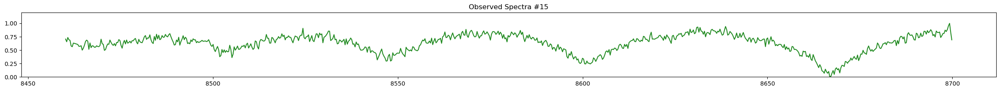

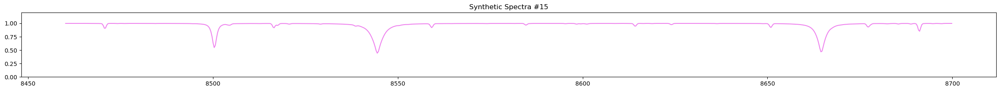

In [44]:
indx = 15

# 867,125 spectra
graph(spectra_obs[indx], obs_color, f'Observed Spectra #{indx}')

# 48,373 spectra
graph(spectra_syn[indx], syn_color, f'Synthetic Spectra #{indx}')

In [45]:
from sklearn.manifold import TSNE

def run_tsne(data_a, data_b, perplex):

    m = len(data_a)

    # Combine data into a single array
    t_data = np.row_stack((data_a,data_b))

    # Convert data to float64 matrix. float64 is need for bh_sne
    t_data = np.asarray(t_data).astype('float64')
    t_data = t_data.reshape((t_data.shape[0], -1))

    # Run t-SNE with reproducible results
    vis_data = TSNE(n_components=2, perplexity=perplex, random_state=42).fit_transform(t_data)
    
    # Separate 2D into x and y axes information
    vis_x_a = vis_data[:m, 0]
    vis_y_a = vis_data[:m, 1]
    vis_x_b = vis_data[m:, 0]
    vis_y_b = vis_data[m:, 1]
    
    return vis_x_a, vis_y_a, vis_x_b, vis_y_b

In [46]:
TX_SYN_IDX = 0
TY_SYN_IDX = 1
TX_OBS_IDX = 2
TY_OBS_IDX = 3

def save_2_tsne(file_path, tx_syn, ty_syn, tx_obs, ty_obs):
    max_len = max(len(tx_syn), len(ty_syn), len(tx_obs), len(ty_obs))
    data = np.empty((max_len, 4))
    data[:, TX_SYN_IDX] = np.pad(tx_syn, (0, max_len - len(tx_syn)), mode='constant', constant_values=np.nan)
    data[:, TY_SYN_IDX] = np.pad(ty_syn, (0, max_len - len(ty_syn)), mode='constant', constant_values=np.nan)
    data[:, TX_OBS_IDX] = np.pad(tx_obs, (0, max_len - len(tx_obs)), mode='constant', constant_values=np.nan)
    data[:, TY_OBS_IDX] = np.pad(ty_obs, (0, max_len - len(ty_obs)), mode='constant', constant_values=np.nan)
    np.savetxt(file_path, data)
    
def save_1_tsne(file_path, x_A, y_A):
    max_len = max(len(x_A), len(y_A))
    data = np.empty((max_len, 2))
    data[:, TX_SYN_IDX] = np.pad(x_A, (0, max_len - len(x_A)), mode='constant', constant_values=np.nan)
    data[:, TY_SYN_IDX] = np.pad(y_A, (0, max_len - len(y_A)), mode='constant', constant_values=np.nan)
    np.savetxt(file_path, data)

def load_2_tsne(file_path):
    data = np.loadtxt(file_path)
    x_A = data[:, TX_SYN_IDX][~np.isnan(data[:, TX_SYN_IDX])]
    y_A = data[:, TY_SYN_IDX][~np.isnan(data[:, TY_SYN_IDX])]
    x_B = data[:, TX_OBS_IDX][~np.isnan(data[:, TX_OBS_IDX])]
    y_B = data[:, TY_OBS_IDX][~np.isnan(data[:, TY_OBS_IDX])]
    return x_A, y_A, x_B, y_B

def load_1_tsne(file_path):
    data = np.loadtxt(file_path)
    x_A = data[:, TX_SYN_IDX][~np.isnan(data[:, TX_SYN_IDX])]
    y_A = data[:, TY_SYN_IDX][~np.isnan(data[:, TY_SYN_IDX])]
    return x_A, y_A

## Full t-SNE

I'd like to make some more interesting t-SNEs. I'd like to plot both datasets with labels. I'd also like to plot the observed dataset by labelled, and un-labelled.

In [ ]:
# Run the t-SNE

start_time = time.time()

tx_syn, ty_syn, tx_obs, ty_obs = run_tsne(spectra_syn, 
                                              spectra_obs, 
                                              perplex=80)

end_time = time.time()

print(f'Elapsed time: {end_time - start_time:.2f} seconds for all {len(spectra_syn) + len(spectra_obs)} samples')
#Elapsed time: 57.56 seconds for 5000 each
#Elapsed time: 8.78 seconds for 1000 samples each
#Elapsed time: 25560.94 seconds for all 915498 samples (7 hours)

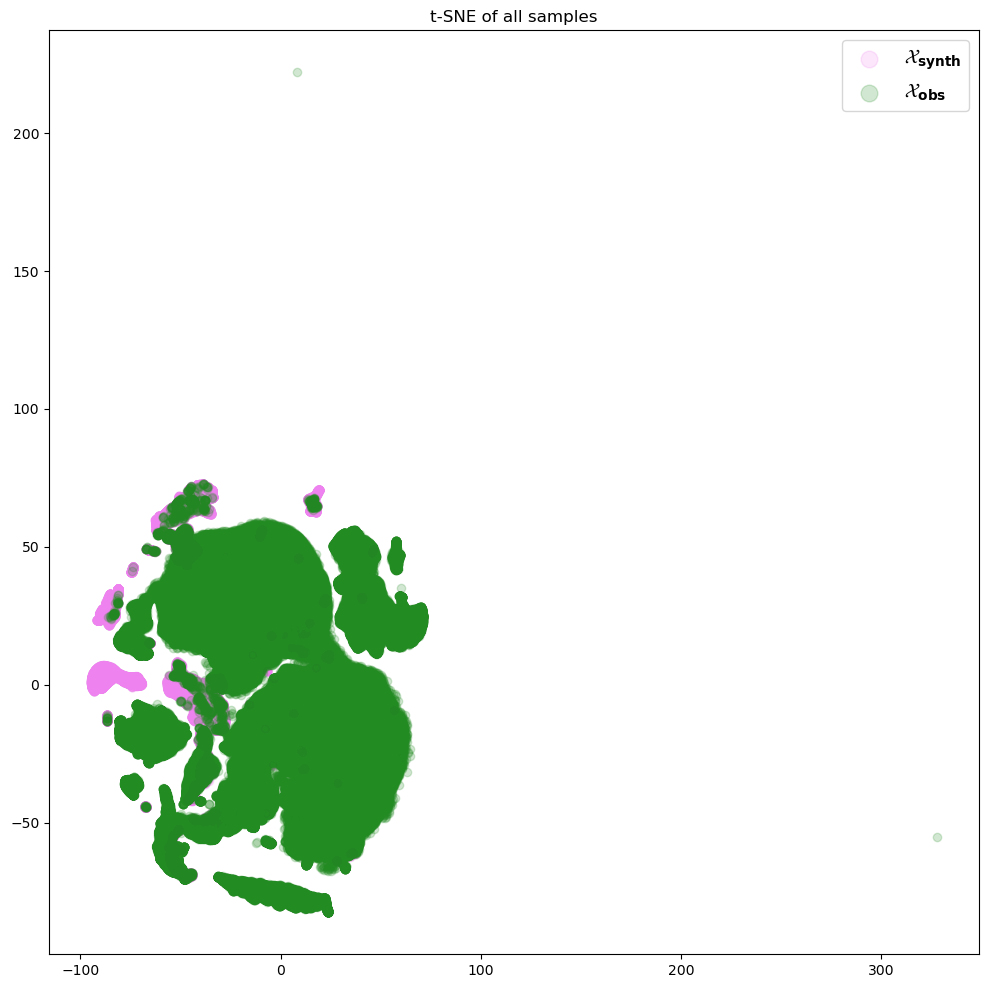

In [21]:
# Plot the initial t-SNE


# Plot them together
plt.figure(figsize=(12,12))
plt.scatter(tx_syn, ty_syn,
            label=r'$\mathbf{\mathcal{X}_{synth}}$',
            marker='o', c=syn_color, alpha=0.2)
plt.scatter(tx_obs, ty_obs,
            label=r'$\mathbf{\mathcal{X}_{obs}}$',
            marker='o', c=obs_color, alpha=0.2)
plt.legend(fontsize=14, frameon=True, fancybox=True, markerscale=2.)
plt.title(f't-SNE of all samples')
plt.show()

I can immediately see some serious outliers for the observed dataset. I would like to find out what they are, and do a tSNE for each dataset individually to look for more outliers like this, especially the observed dataset.

In [25]:
def find_outlier_indexes(values, threshold):
    return np.where(values > threshold)[0]

ty_obs_outlier_indexes = find_outlier_indexes(ty_obs, 110)
tx_obs_outlier_indexes = find_outlier_indexes(tx_obs, 110)

print("Indexes of outliers in ty_obs:")
print(ty_obs_outlier_indexes)

print("Indexes of outliers in tx_obs:")
print(tx_obs_outlier_indexes)

Indexes of outliers in ty_obs:
[414689]
Indexes of outliers in tx_obs:
[352897]


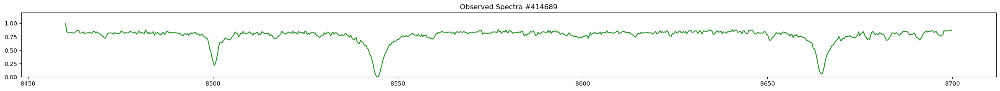

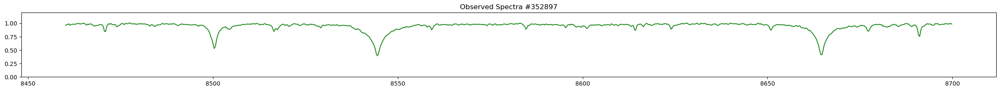

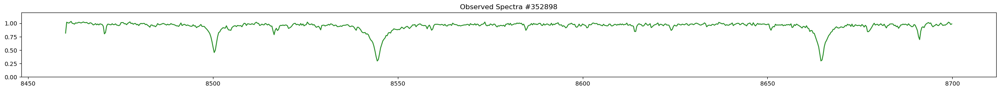

In [27]:
indx = 414689
graph(spectra_obs[indx], obs_color, f'Observed Spectra #{indx}')
indx = 352897
graph(spectra_obs[indx], obs_color, f'Observed Spectra #{indx}')
indx = 352898
graph(spectra_obs[indx], obs_color, f'Observed Spectra #{indx}')

In [22]:
# Save the matrices to a file
save_tsne_matrices('tsne_all.txt', tx_syn, ty_syn, tx_obs, ty_obs)

# Load the matrices from the file
#tx_syn_loaded, ty_syn_loaded, tx_obs_loaded, ty_obs_loaded = load_tsne_matrices('tsne_matrices.txt')

In [14]:
print(tx_syn.shape)
print(ty_syn.shape)
print(tx_obs.shape)
print(ty_obs.shape)

(48373,)
(48373,)
(867125,)
(867125,)


In [23]:
print(f'Elapsed time: {end_time - start_time:.2f} seconds for all {len(spectra_syn) + len(spectra_obs)} samples')

Elapsed time: 25560.94 seconds for all 915498 samples


## Single t-SNEs

t-SNE for just synthetic

Elapsed time: 266.48 seconds for all 48373 synthetic samples


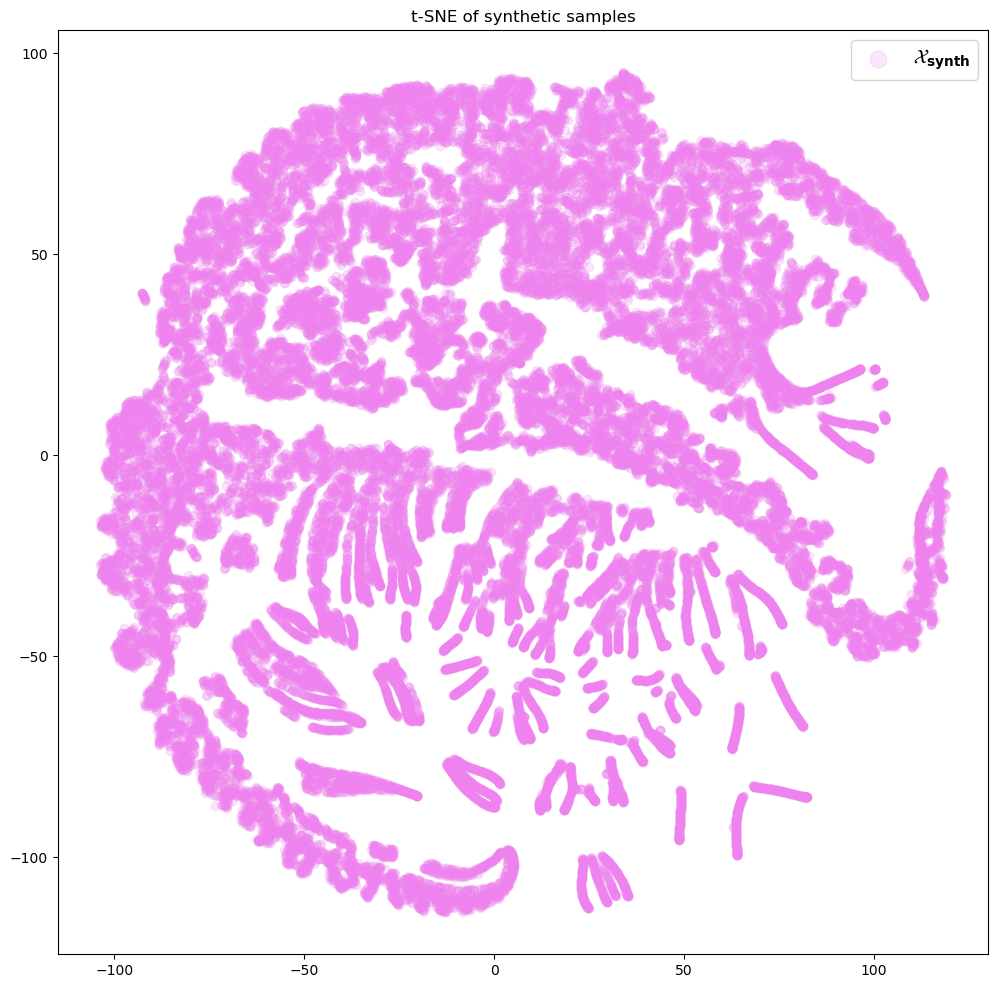

In [30]:
# Run the t-SNE

start_time_syn = time.time()

vis_data = TSNE(n_components=2, perplexity=50, random_state=110).fit_transform(spectra_syn)

end_time_syn = time.time()

print(f'Elapsed time: {end_time_syn - start_time_syn:.2f} seconds for all {len(spectra_syn)} synthetic samples')

syn_x = vis_data[:, 0]
syn_y = vis_data[:, 1]


# Save the matrices to a file
save_tsne_matrices('tsne_syn_50perp.txt', syn_x, syn_y, syn_x, syn_y)

# Load the matrices from the file
#tx_syn_loaded, ty_syn_loaded, tx_obs_loaded, ty_obs_loaded = load_tsne_matrices('tsne_matrices.txt')

# Plot them together
plt.figure(figsize=(12,12))
plt.scatter(syn_x, syn_y,
            label=r'$\mathbf{\mathcal{X}_{synth}}$',
            marker='o', c=syn_color, alpha=0.2)
plt.legend(fontsize=14, frameon=True, fancybox=True, markerscale=2.)
plt.title(f't-SNE of synthetic samples')
plt.show()

#Elapsed time: 338.30 seconds for all 48373 synthetic samples (perplexity of 98)
#Elapsed time: 266.48 seconds for all 48373 synthetic samples

t-SNE for just observed

Elapsed time: 23207.29 seconds for all 867125 observed samples


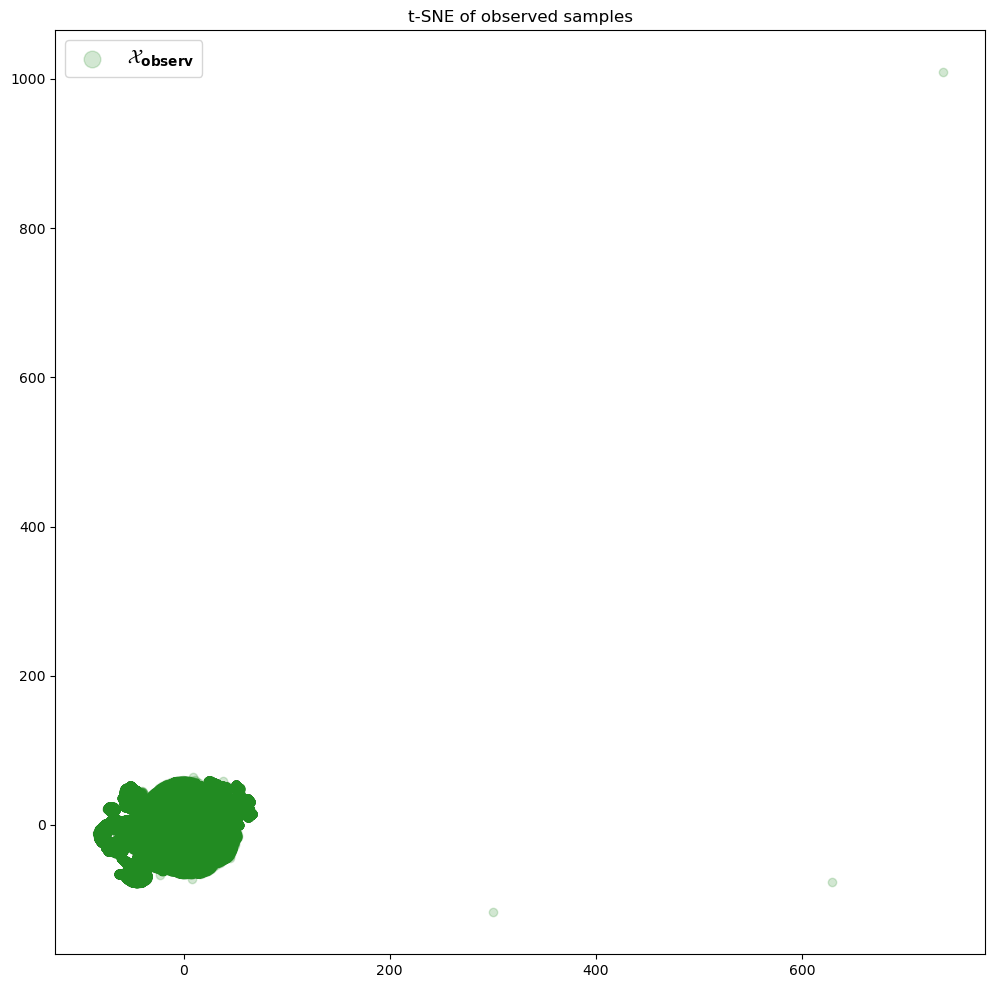

In [31]:
# Run the t-SNE

start_time_obs = time.time()

obs_data = TSNE(n_components=2, perplexity=50, random_state=110).fit_transform(spectra_obs)

end_time_obs = time.time()

print(f'Elapsed time: {end_time_obs - start_time_obs:.2f} seconds for all {len(spectra_obs)} observed samples')

obs_x = obs_data[:, 0]
obs_y = obs_data[:, 1]


# Save the matrices to a file
save_tsne_matrices('tsne_obs.txt', obs_x, obs_y, obs_x, obs_y)

# Load the matrices from the file
#tx_syn_loaded, ty_syn_loaded, tx_obs_loaded, ty_obs_loaded = load_tsne_matrices('tsne_matrices.txt')

# Plot them together
plt.figure(figsize=(12,12))
plt.scatter(obs_x, obs_y,
            label=r'$\mathbf{\mathcal{X}_{observ}}$',
            marker='o', c=obs_color, alpha=0.2)
plt.legend(fontsize=14, frameon=True, fancybox=True, markerscale=2.)
plt.title(f't-SNE of observed samples')
plt.show()

#Elapsed time: 338.30 seconds for all 48373 synthetic samples
#Elapsed time: 23207.29 seconds for all 867125 observed samples (6.5 hours)

In [34]:
#Trying to find those outliers
len(obs_x)

ty_obs_outlier_indexes = find_outlier_indexes(obs_x, 200)
tx_obs_outlier_indexes = find_outlier_indexes(obs_y, 200)

print("Indexes of outliers in ty_obs:")
print(ty_obs_outlier_indexes)

print("Indexes of outliers in tx_obs:")
print(tx_obs_outlier_indexes)

Indexes of outliers in ty_obs:
[438030 441359 711791]
Indexes of outliers in tx_obs:
[438030]


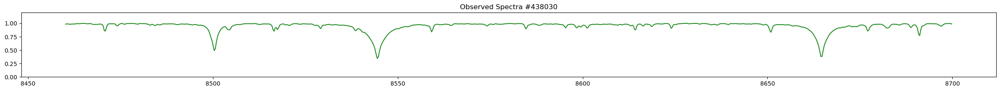

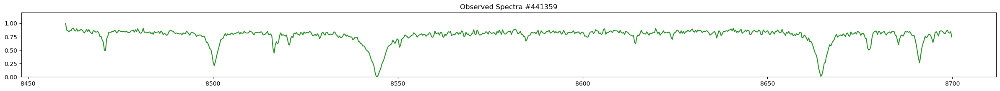

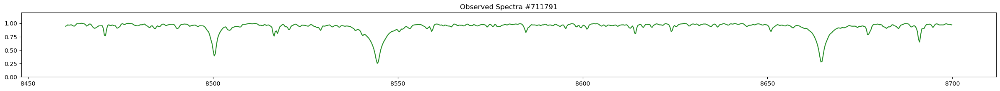

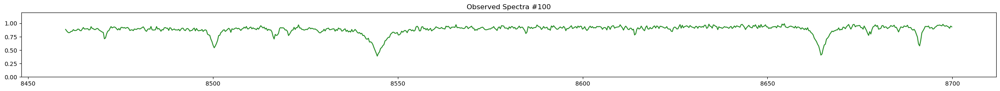

736.3412

In [38]:
for indx in ty_obs_outlier_indexes:
    graph(spectra_obs[indx], obs_color, f'Observed Spectra #{indx}')
  
indx = 100
graph(spectra_obs[indx], obs_color, f'Observed Spectra #{indx}')
obs_x[438030]


#Indexes of outliers in ty_obs:
#[414689]
#Indexes of outliers in tx_obs:
#[352897]

Elapsed time: 19966.56 seconds for all 867125 observed samples


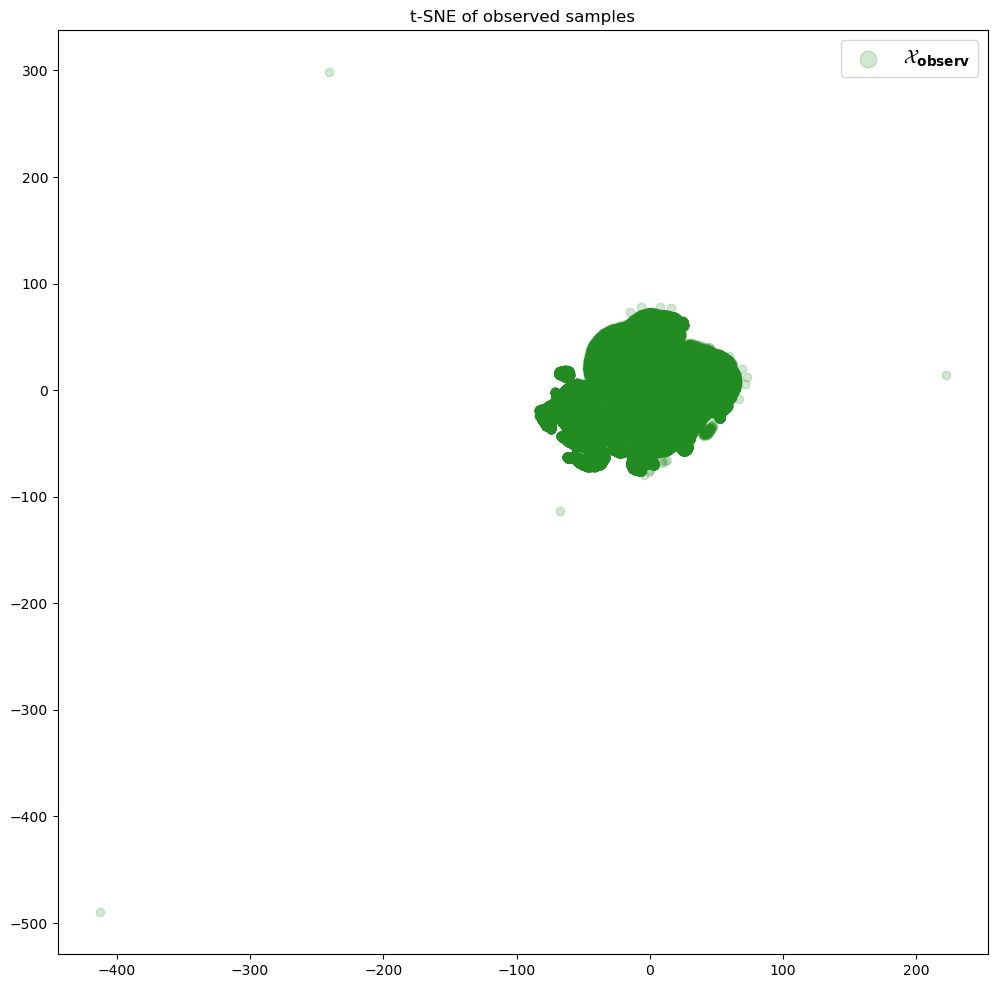

In [39]:
# Run the t-SNE

start_time_obs = time.time()

obs_data = TSNE(n_components=2, perplexity=25, random_state=68).fit_transform(spectra_obs)

end_time_obs = time.time()

print(f'Elapsed time: {end_time_obs - start_time_obs:.2f} seconds for all {len(spectra_obs)} observed samples')

obs_x = obs_data[:, 0]
obs_y = obs_data[:, 1]


# Save the matrices to a file
save_tsne_matrices('tsne_obs_25perp.txt', obs_x, obs_y, obs_x, obs_y)

# Load the matrices from the file
#tx_syn_loaded, ty_syn_loaded, tx_obs_loaded, ty_obs_loaded = load_tsne_matrices('tsne_matrices.txt')

# Plot them together
plt.figure(figsize=(12,12))
plt.scatter(obs_x, obs_y,
            label=r'$\mathbf{\mathcal{X}_{observ}}$',
            marker='o', c=obs_color, alpha=0.2)
plt.legend(fontsize=14, frameon=True, fancybox=True, markerscale=2.)
plt.title(f't-SNE of observed samples')
plt.show()

#Elapsed time: 338.30 seconds for all 48373 synthetic samples
#Elapsed time: 23207.29 seconds for all 867125 observed samples (6.5 hours) perp 50
#Elapsed time: 19966.56 seconds for all 867125 observed samples (5.5 hours) perp 25

In [ ]:
def find_outlier_min_indexes(values, threshold):
    return np.where(values < threshold)[0]

#Trying to find those outliers

ty_obs_outlier_indexes = find_outlier_indexes(obs_x, 200)
tx_obs_outlier_indexes = find_outlier_indexes(obs_y, 200)

print("Indexes of outliers in ty_obs:")
print(ty_obs_outlier_indexes)

print("Indexes of outliers in tx_obs:")
print(tx_obs_outlier_indexes)

## Plotting t-SNEs

Loading and plotting different combinations of t-SNEs

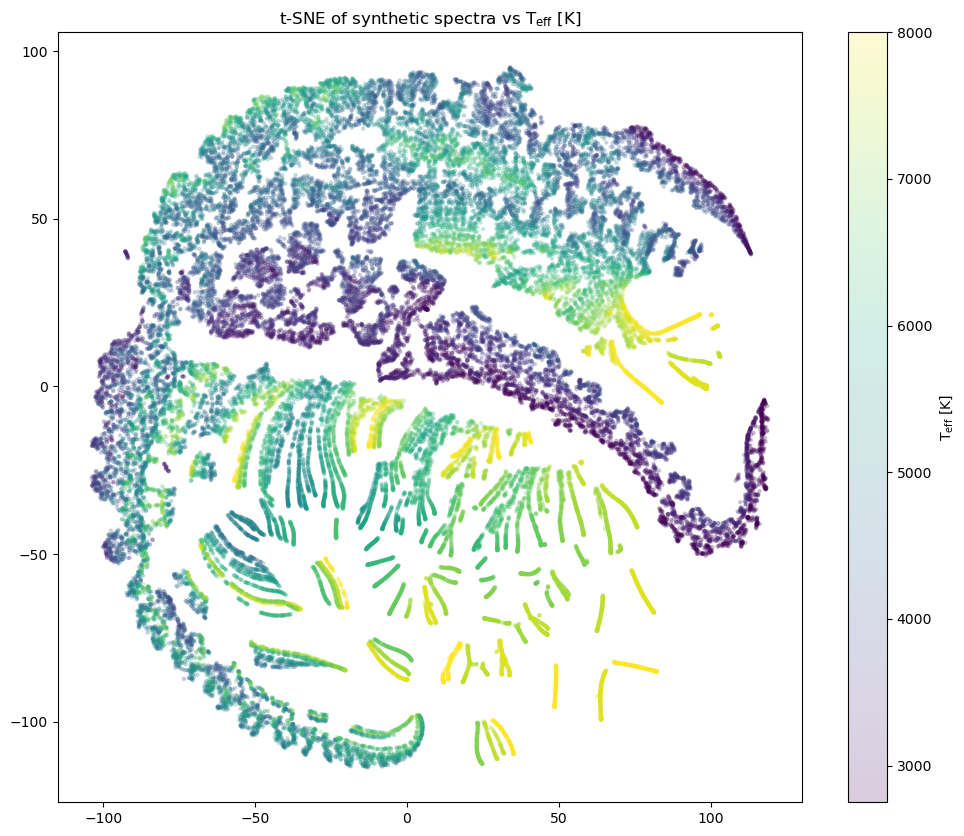

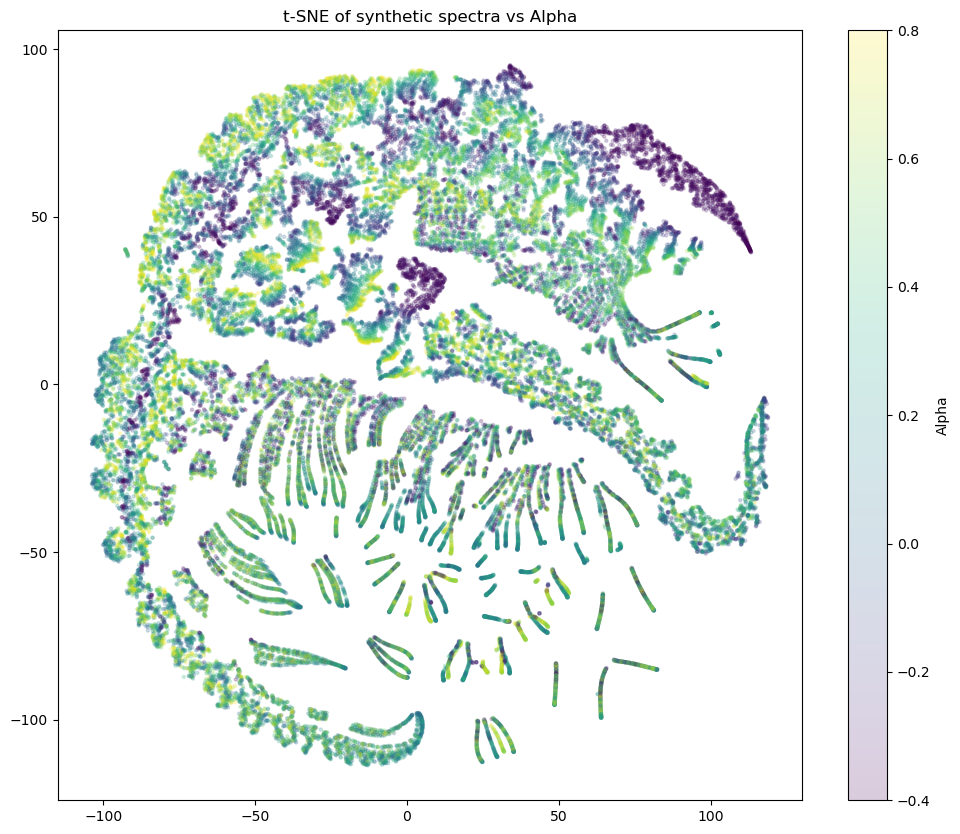

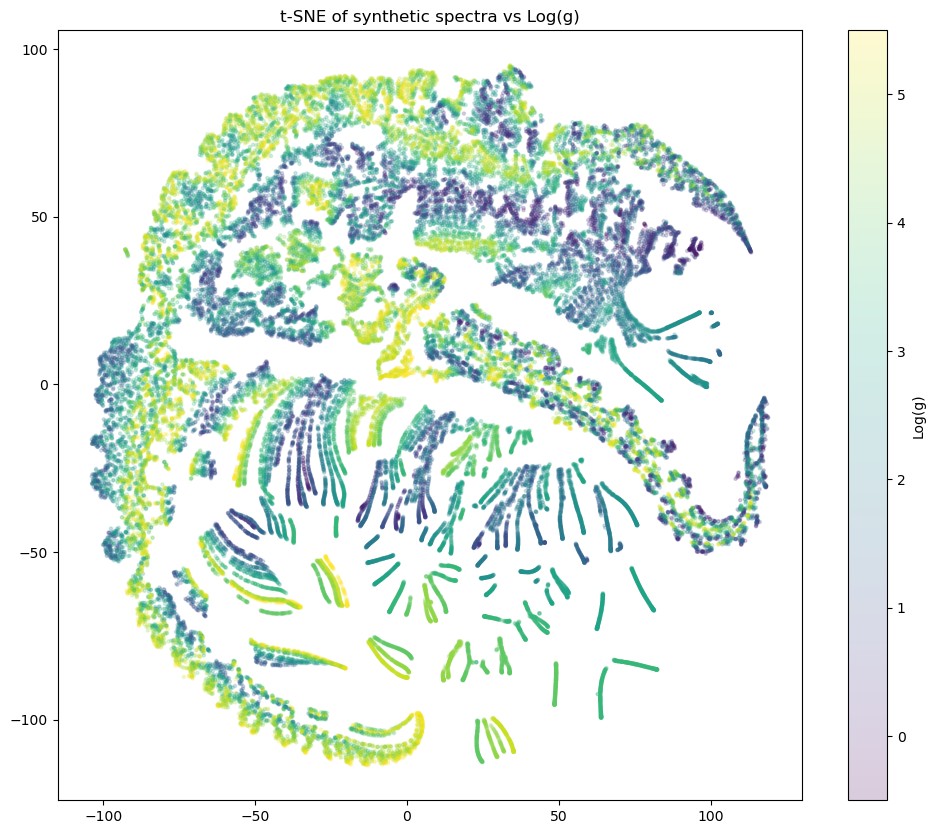

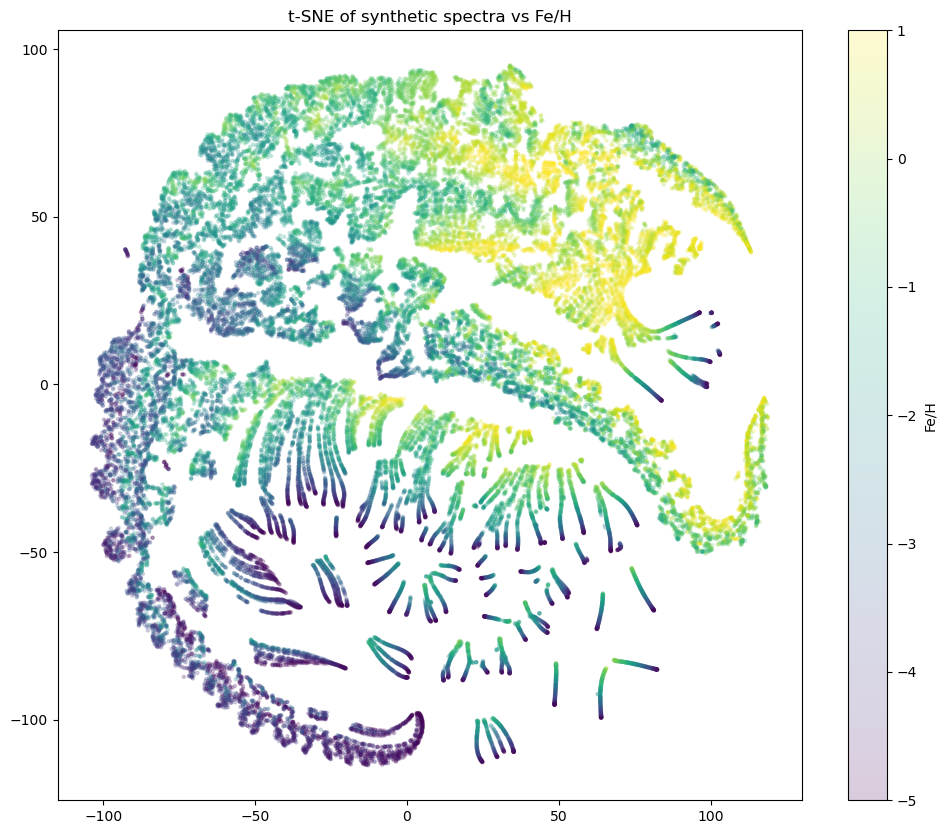

In [88]:
tsne_path = 'tsnes/'
# Load synthetic tSNE data
x, y = load_1_tsne("tsne_syn_50perp.txt")

labels =     [teff_syn,  alpha_syn, logg_syn, feh_syn]
texts =      ['T$_{\mathrm{eff}}$ [K]', 'Alpha', 'Log(g)', 'Fe/H']
file_names = ['teff', 'alpha', 'logg', 'feh']

for i in range(4):
    label = labels[i]
    # Plot tsne data, with x and y coordinates from syn_x and syn_y, and color mapped from values in label
    plt.figure(figsize=(12,10))
    plt.scatter(x, y, c=labels[i], marker='o', alpha=0.2, cmap='viridis', s=5.0)
    plt.colorbar(label=texts[i], cmap='viridis')
    #plt.xlim(-10, 10)
    #plt.ylim(-10, 10)
    plt.title(f't-SNE of synthetic spectra vs ' + texts[i])
    plt.savefig(tsne_path + 'syn_' + file_names[i] + '.png')
    plt.show()



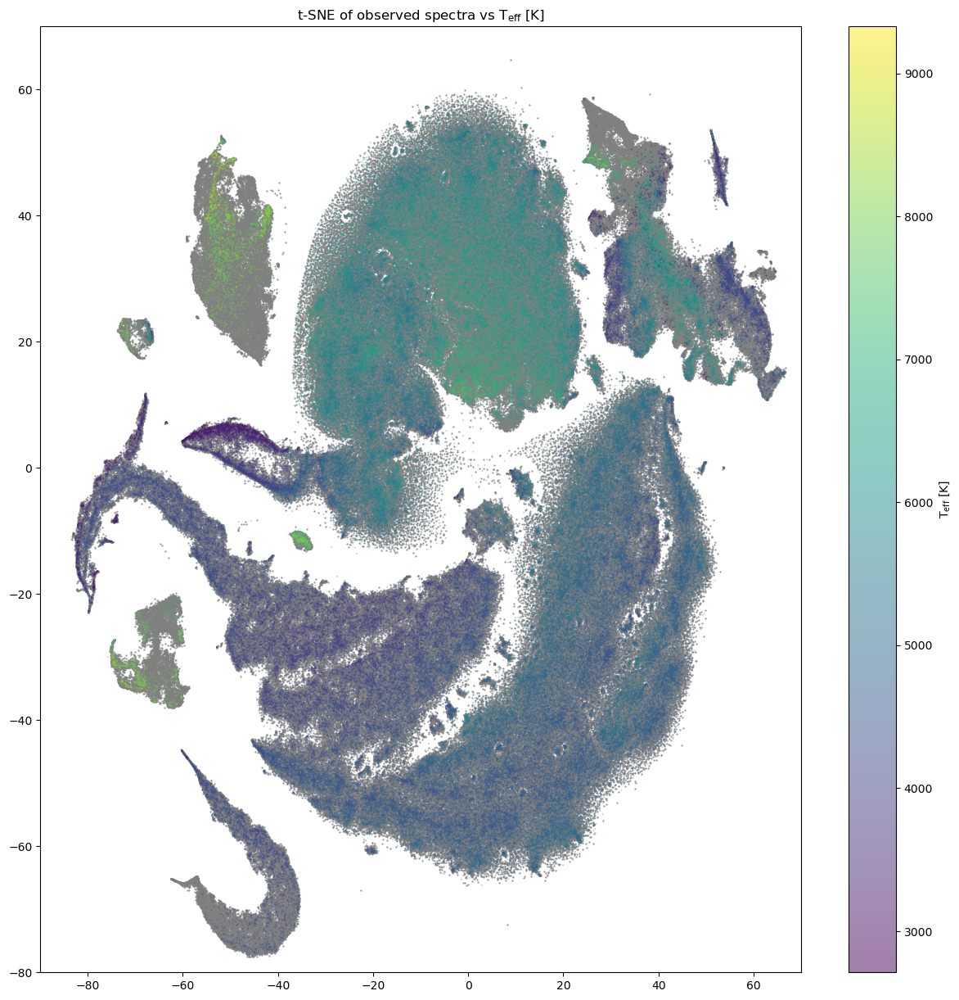

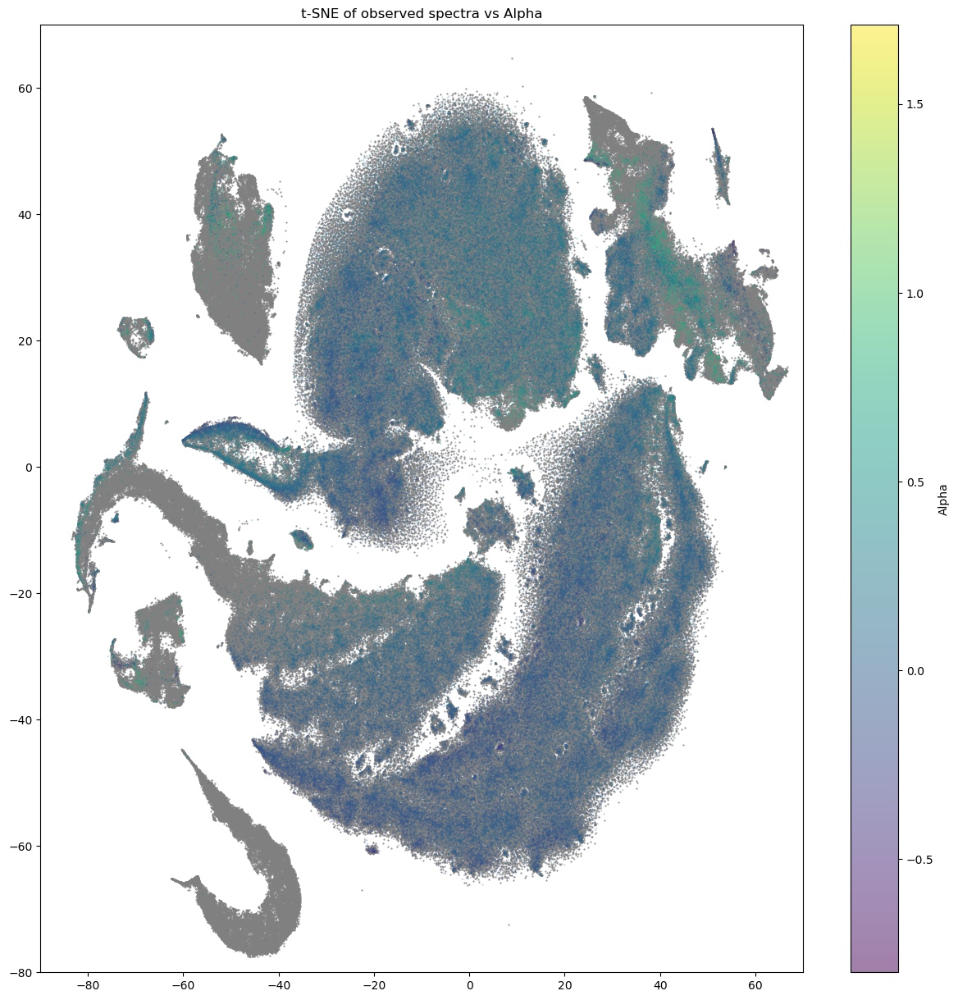

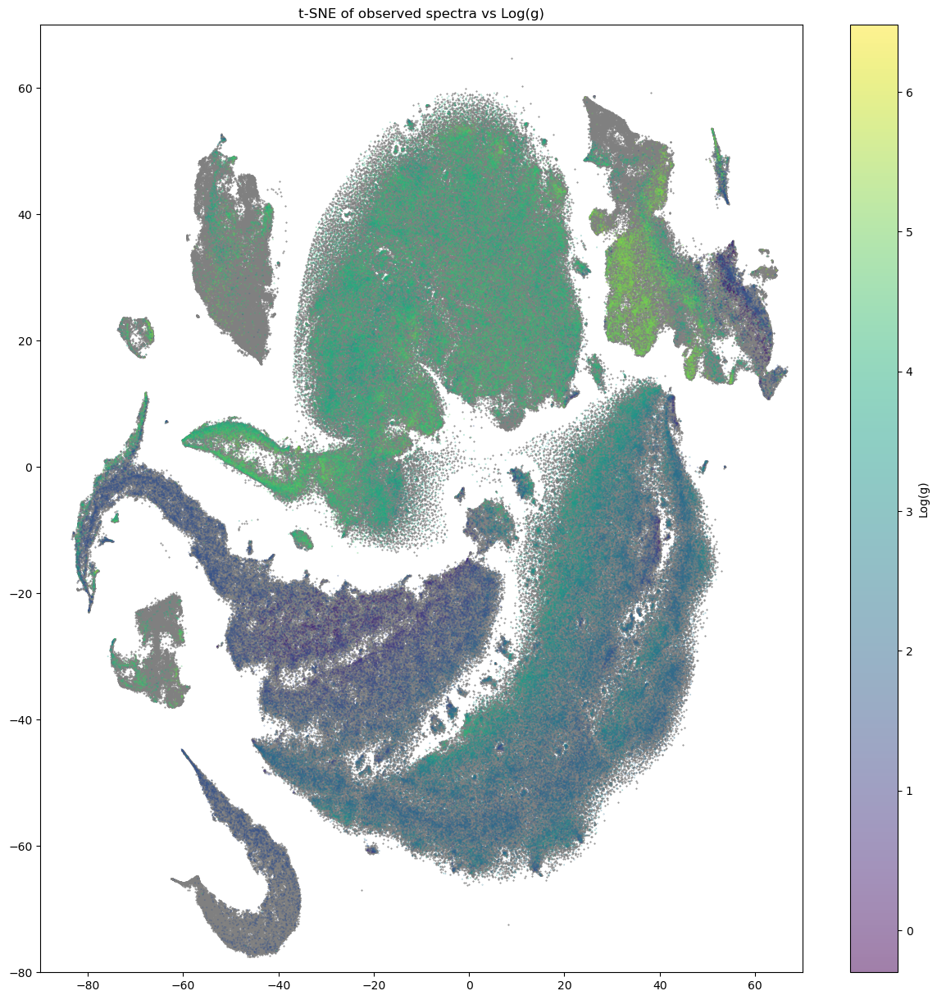

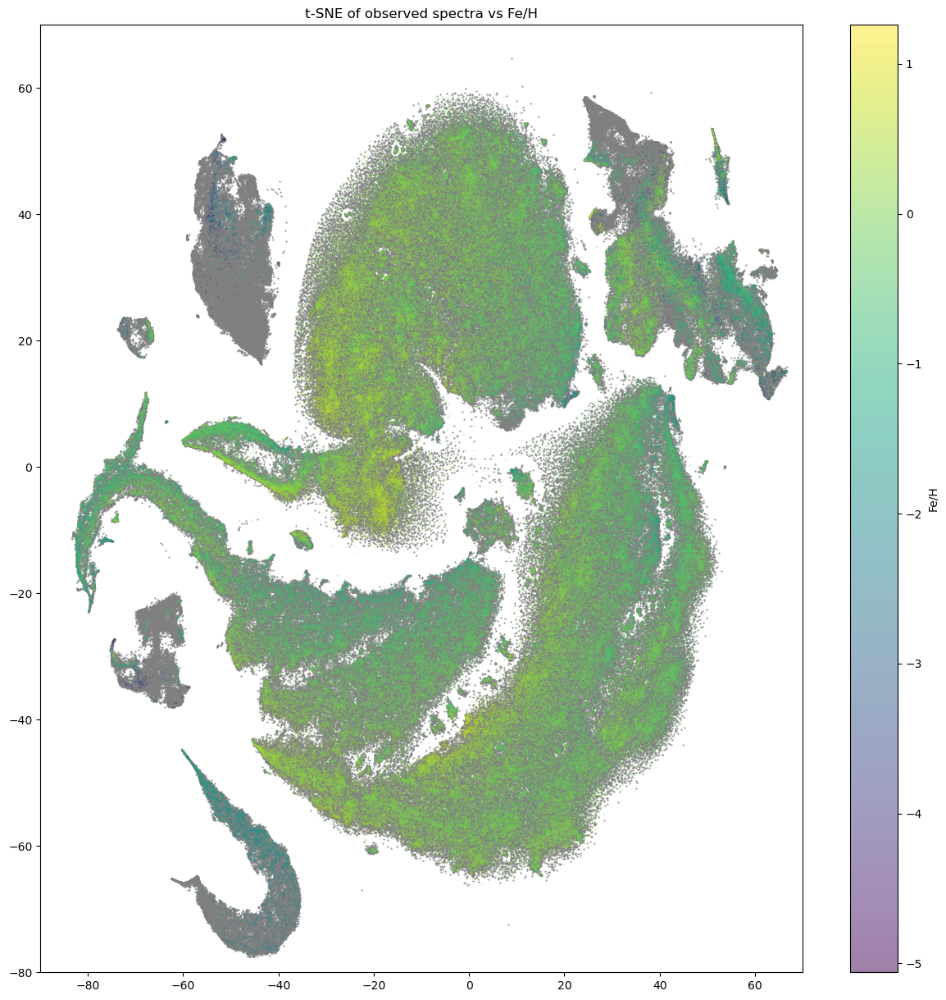

In [89]:
# Load synthetic tSNE data
x, y = load_1_tsne("tsne_obs_50perp.txt")

nan_color = 'gray' #color for points with nan values

labels =     [teff_obs,  alpha_obs, logg_obs, feh_obs]
texts =      ['T$_{\mathrm{eff}}$ [K]', 'Alpha', 'Log(g)', 'Fe/H']
file_names = ['teff', 'alpha', 'logg', 'feh']

for i in range(4):
    plt.figure(figsize=(15,15))
    label = labels[i]
    
    # Extract values of x where the corresponding indices in label are NaN and not NaN
    x_nan = x[np.isnan(label)]
    x_ = x[~np.isnan(label)]
    
    # Extract values of y where the corresponding indices in label are NaN and not NaN
    y_nan = y[np.isnan(label)]
    y_ = y[~np.isnan(label)]
    
    # Remove NaN values from the label array
    labels_ = label[~np.isnan(label)]
    
    # Plot nan values
    plt.scatter(x_nan, y_nan, c=nan_color, marker='o', alpha=1.0, s=0.25)
    # Plot non-nan values
    plt.scatter(x_, y_, c=labels_, marker='o', alpha=0.5, cmap='viridis', s=0.1)
    
    plt.colorbar(label=texts[i], cmap='viridis')
    plt.xlim(-90, 70)
    plt.ylim(-80, 70)
    plt.title(f't-SNE of observed spectra vs ' + texts[i])
    plt.savefig(tsne_path + 'obs_' + file_names[i] + '.png')
    plt.show()



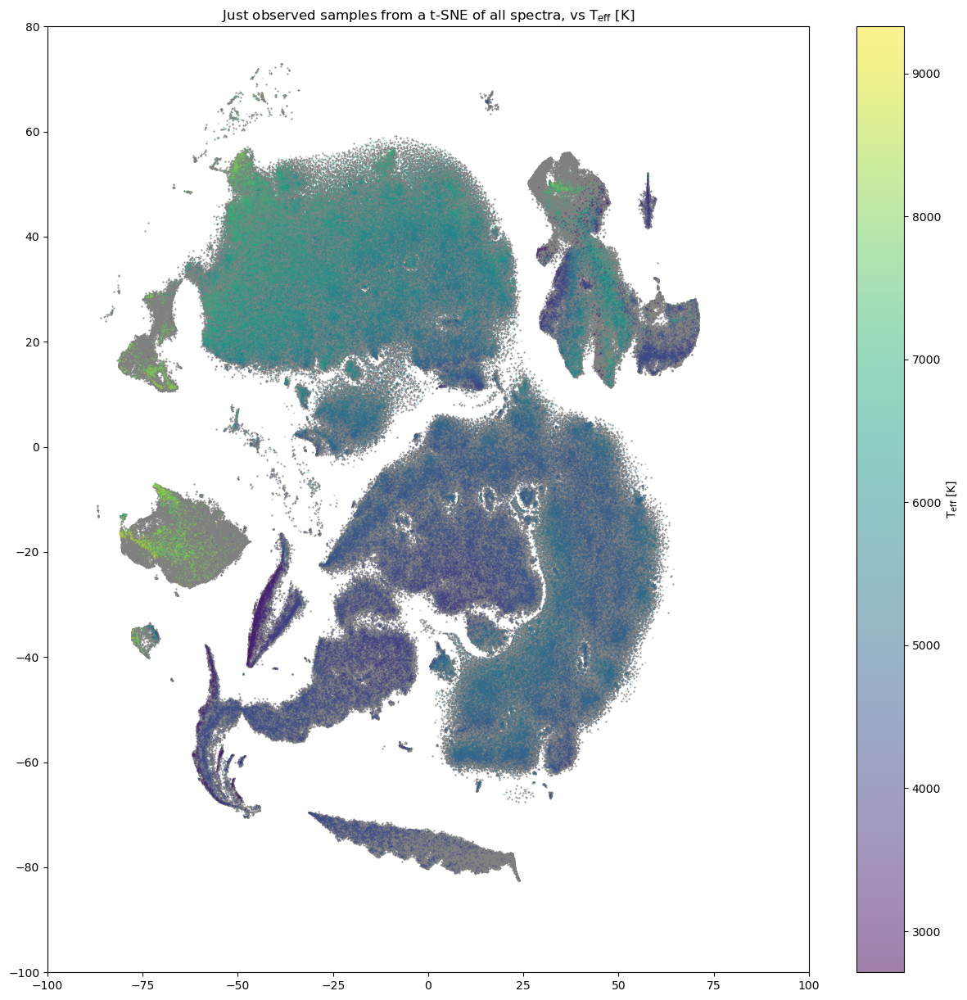

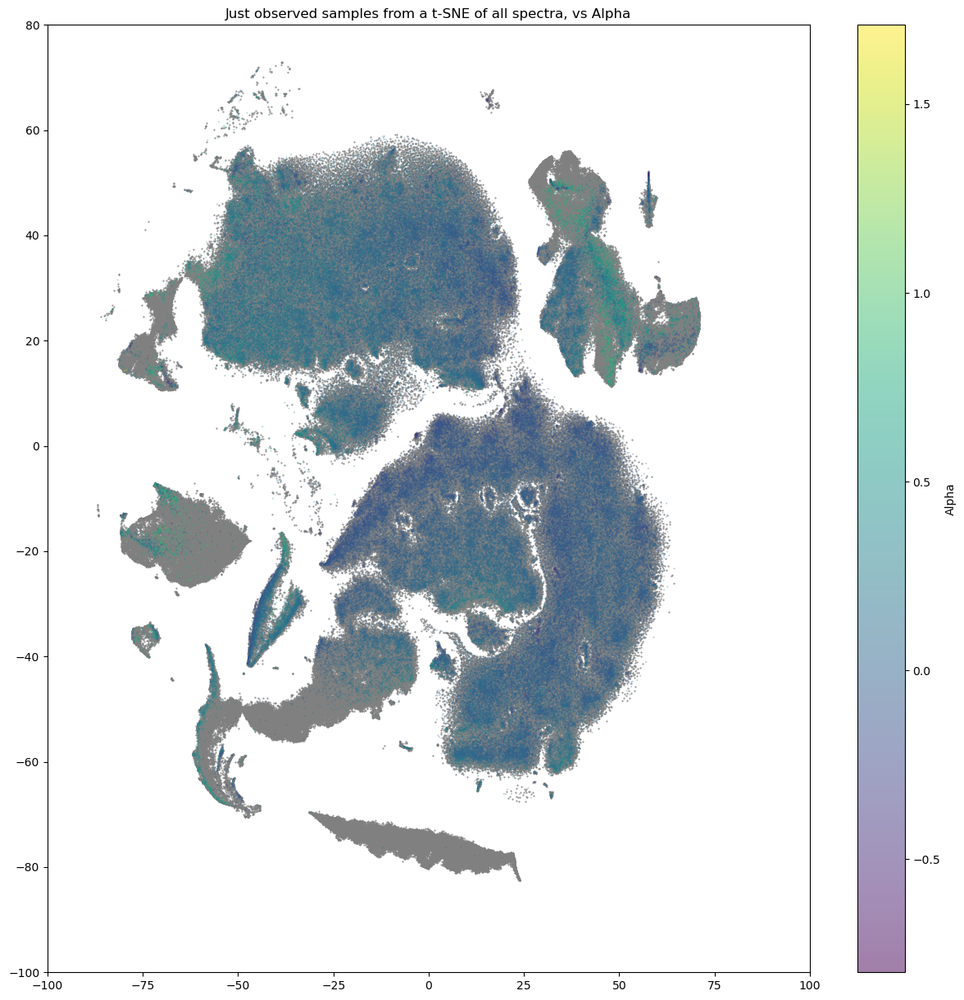

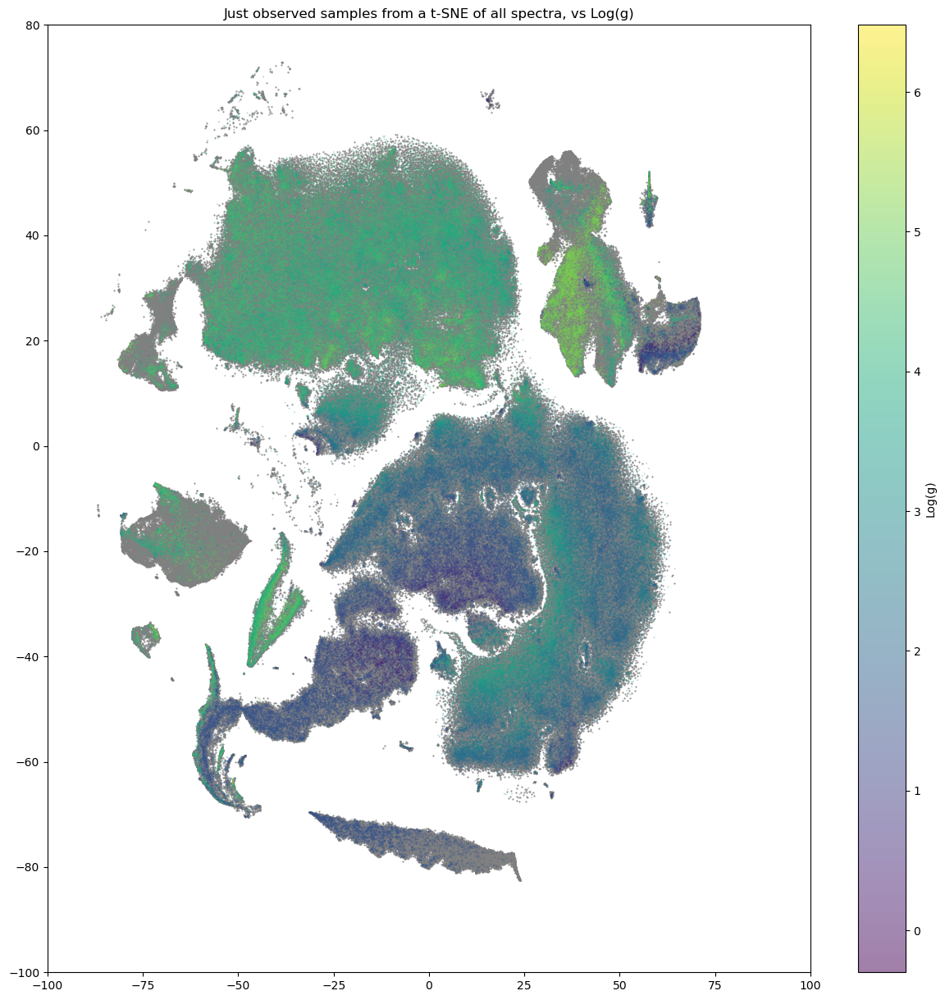

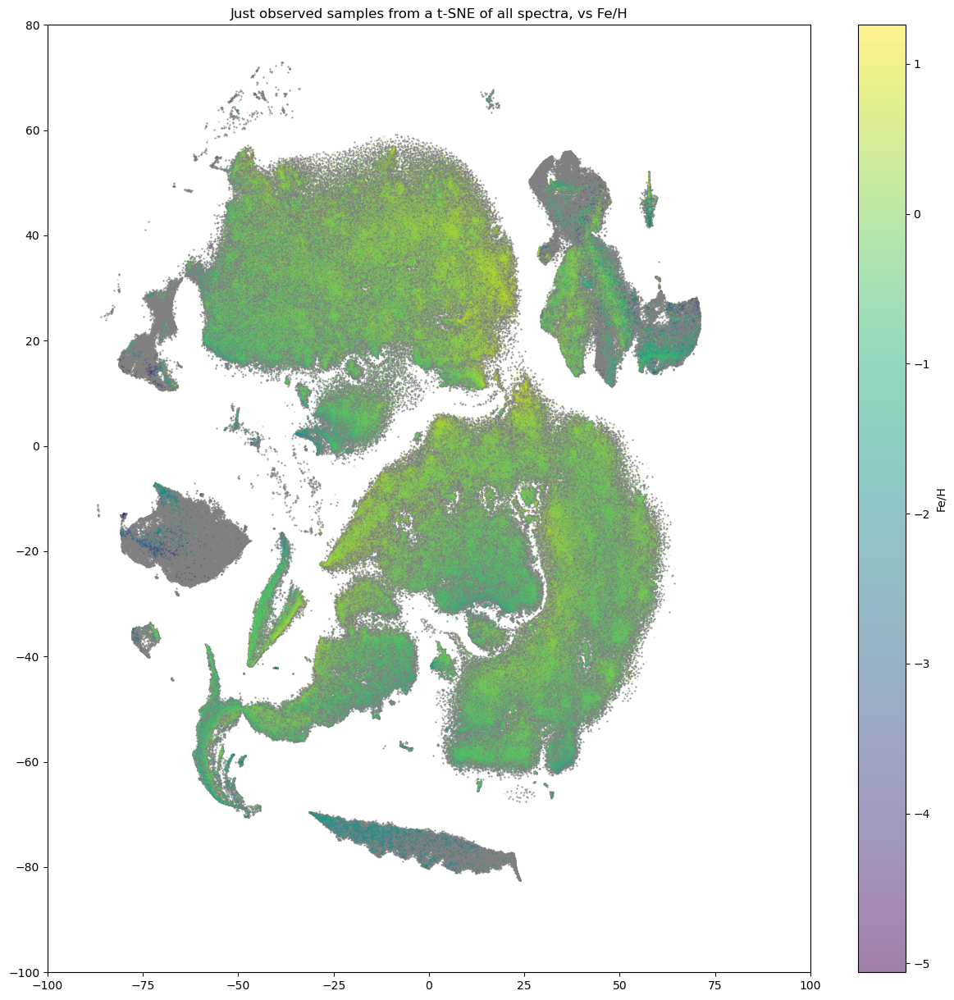

In [90]:
# Load combined tSNE data
x_syn, y_syn, x_obs, y_obs = load_2_tsne("tsne_all.txt")

labels_obs =     [teff_obs,  alpha_obs, logg_obs, feh_obs]
labels_syn =     [teff_syn,  alpha_syn, logg_syn, feh_syn]
texts =      ['T$_{\mathrm{eff}}$ [K]', 'Alpha', 'Log(g)', 'Fe/H']
file_names = ['teff', 'alpha', 'logg', 'feh']

for i in range(4):
    plt.figure(figsize=(15,15))
    label = labels_obs[i]
    
    # Extract values of x where the corresponding indices in label are NaN and not NaN
    x_nan = x_obs[np.isnan(label)]
    x_ = x_obs[~np.isnan(label)]
    
    # Extract values of y where the corresponding indices in label are NaN and not NaN
    y_nan = y_obs[np.isnan(label)]
    y_ = y_obs[~np.isnan(label)]
    
    # Remove NaN values from the label array
    labels_ = label[~np.isnan(label)]
    
    # Plot nan values
    plt.scatter(x_nan, y_nan, c=nan_color, marker='o', alpha=1.0, s=0.25)
    # Plot non-nan values
    plt.scatter(x_, y_, c=labels_, marker='o', alpha=0.5, cmap='viridis', s=0.1)
    
    plt.colorbar(label=texts[i], cmap='viridis')
    plt.xlim(-100, 100)
    plt.ylim(-100, 80)
    plt.title(f'Just observed samples from a t-SNE of all spectra, vs ' + texts[i])
    plt.savefig(tsne_path + 'all_obsOnly' + file_names[i] + '.png')
    plt.show()



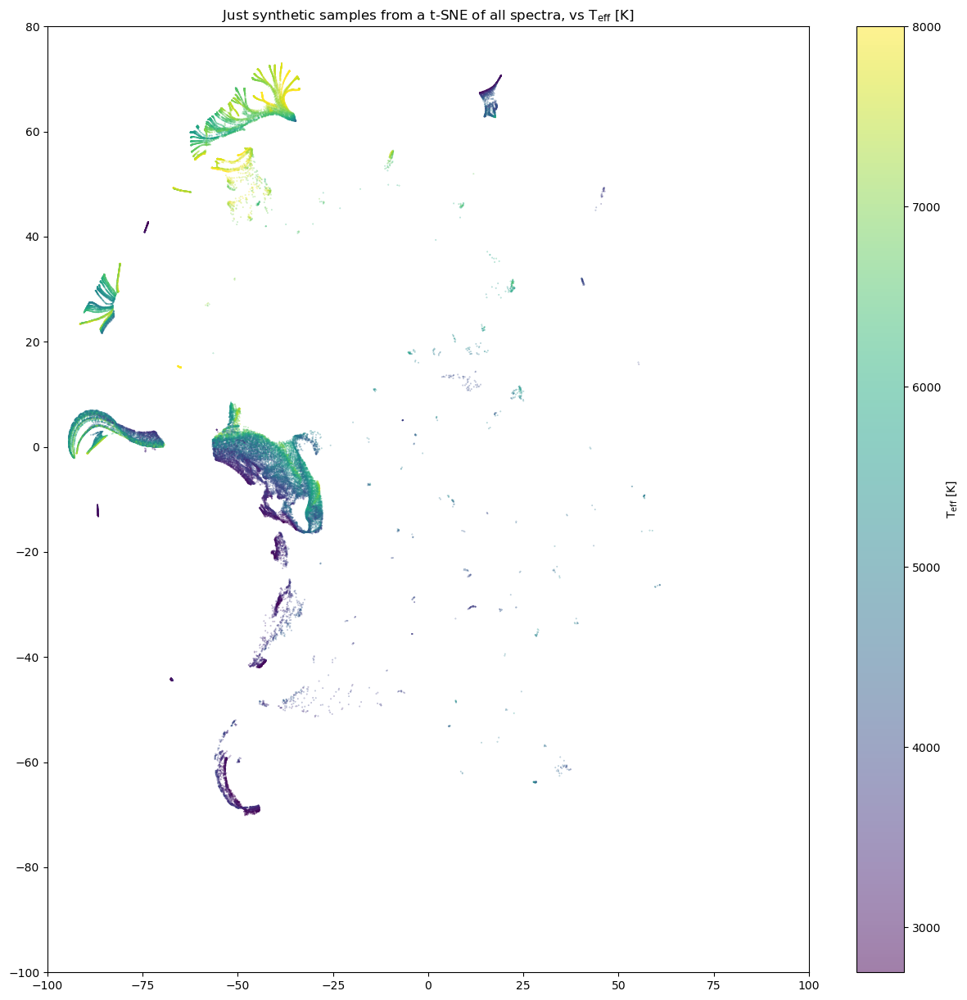

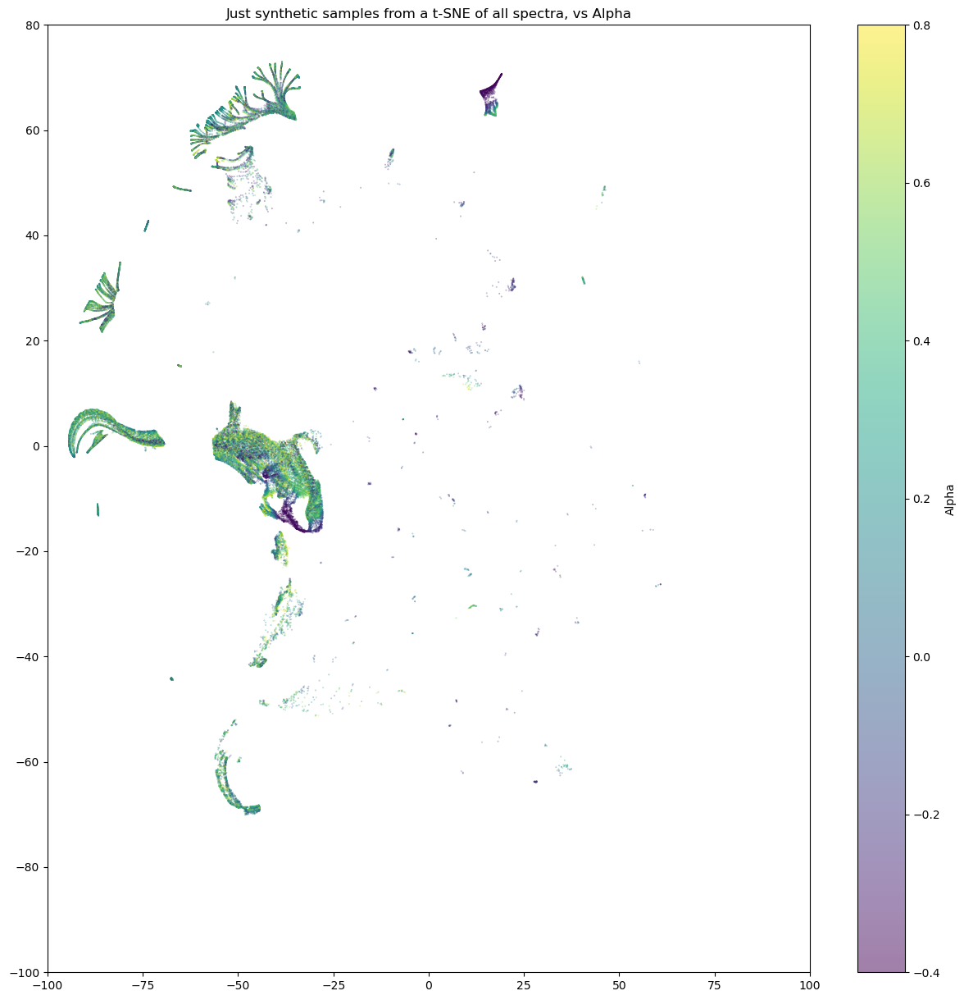

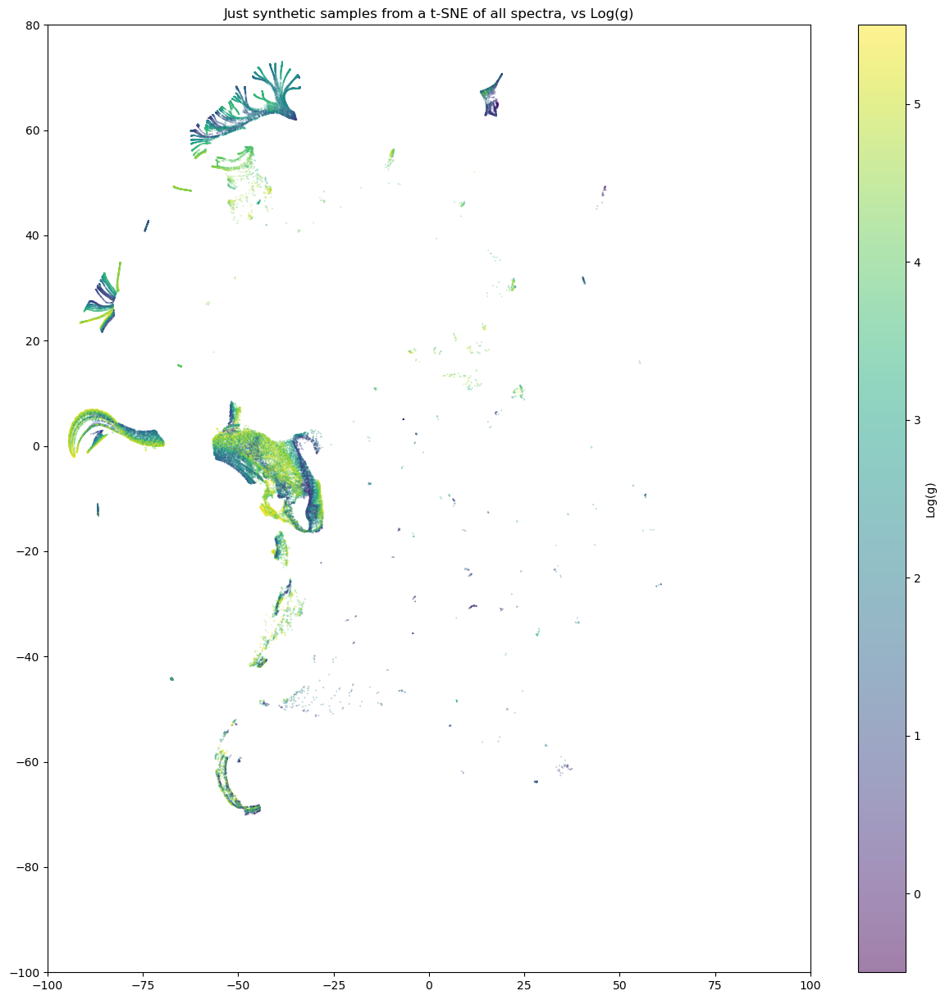

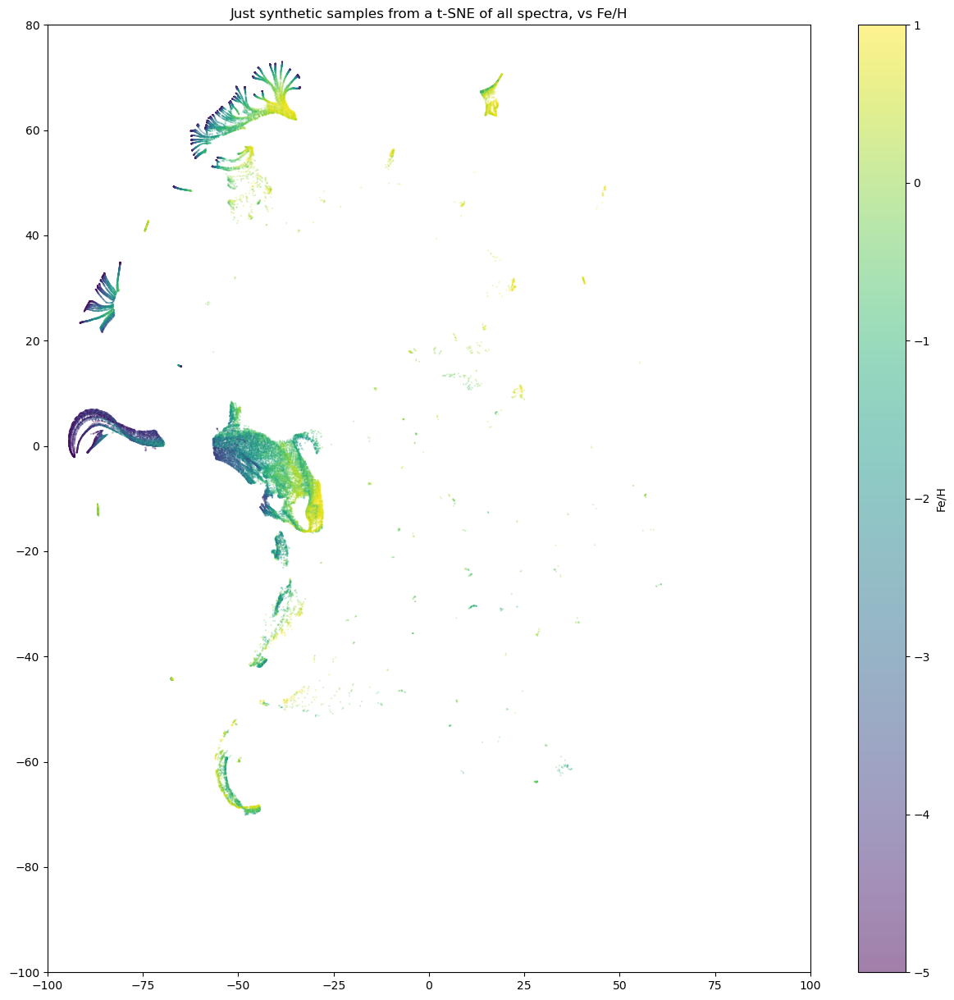

In [91]:
for i in range(4):
    plt.figure(figsize=(15,15))
    
    plt.scatter(x_syn, y_syn, c=labels_syn[i], marker='o', alpha=0.5, cmap='viridis',s=0.1)
    
    plt.colorbar(label=texts[i], cmap='viridis')
    plt.xlim(-100, 100)
    plt.ylim(-100, 80)
    plt.title(f'Just synthetic samples from a t-SNE of all spectra, vs ' + texts[i])
    plt.savefig(tsne_path + 'all_synOnly' + file_names[i] + '.png')
    plt.show()

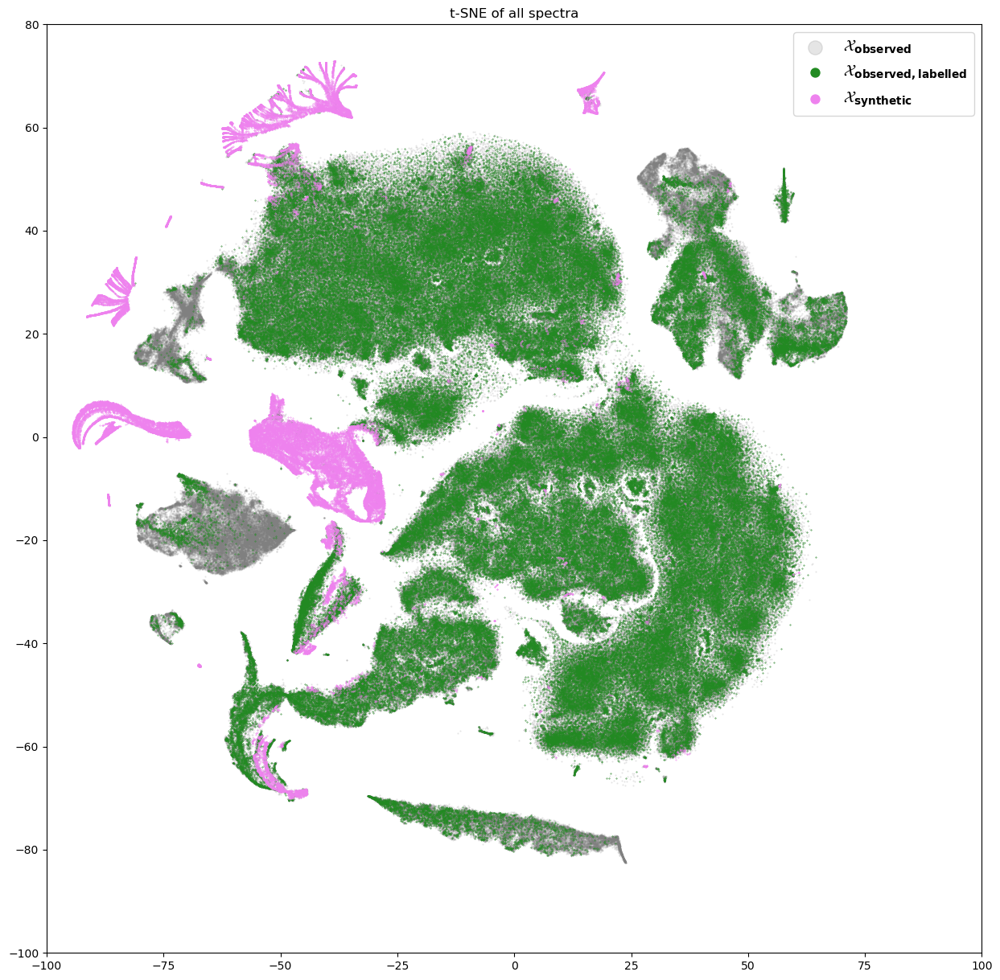

In [92]:
# Plot the combined t-SNE


# Extract values of x where the corresponding indices in label are NaN and not NaN
x_ = x_obs[~np.isnan(label)]

# Extract values of y where the corresponding indices in label are NaN and not NaN
y_ = y_obs[~np.isnan(label)]
    
    
    
plt.figure(figsize=(15,15))
plt.scatter(x_obs, y_obs,
            label=r'$\mathbf{\mathcal{X}_{observed}}$',
            marker='o', c=nan_color, alpha=0.2, s=0.25)

plt.scatter(x_, y_,
            label=r'$\mathbf{\mathcal{X}_{observed,labelled}}$',
            marker='o', c=obs_color, alpha=1.0, s=0.1)

plt.scatter(x_syn, y_syn,
            label=r'$\mathbf{\mathcal{X}_{synthetic}}$',
            marker='o', c=syn_color, alpha=1.0, s=0.1)


plt.legend(fontsize=14, frameon=True, fancybox=True, markerscale=25.0)

plt.xlim(-100, 100)
plt.ylim(-100, 80)
plt.title(f't-SNE of all spectra')
plt.savefig(tsne_path + 'all_.png')
plt.show()